# Personal projects for the course of Image Processing
**Matthieu Borelle ASI 2A 2020-2021**
## Hand and fingers tracking for computer mouse control

**Objectives** 
##### The objectives of this project are :
- To create a detector of touching fingers from webcam video and using machine learning model
- To link it with some smooth control of the computer mouse : movement , left/right click, scroll ...

***Main source :***
##### https://www.youtube.com/watch?v=NZde8Xt78Iw #####


In [4]:
# Installation of unknown packages
pip install --user mediapipe
pip install --user pynput
pip install opencv-python
pip install -U autopy

In [2]:
# Import of needed packages
from cv2 import *
import mediapipe as mp  #pip install --user mediapipe
import time
import math
import autopy
import sys
import matplotlib.pyplot as plt
#import HandTrackingModule #as htrm
from pynput.mouse import Button, Controller


 ####  Let's begin with a simple window of you webcam and a command to close it. We can also add a FPS counter


In [2]:
m = 1.4;
hcam = int(480*m) #720
wcam = int(640*m) #1280
cap = cv2.VideoCapture(1)
cap.set(3,wcam)  # width of the window
cap.set(4,hcam)  # height of the window
pTime = 0 # previous value of time
cTime = 0 # current value of time

while True:
    success,img = cap.read()
    cv2.waitKey(10) 
    cTime = time.time()
    fps = 1/(cTime-pTime)
    pTime = cTime

    #cv2.line(img,(0,int(0.9*h)),(w,int(0.9*h)),(255,255,255), 4)
    cv2.putText(img,str(int(fps)),(10,50),cv2.FONT_HERSHEY_SCRIPT_SIMPLEX,1,(250,250,250),1)
    cv2.imshow("MyWebcam",img)
   
    if (cv2.waitKey(1) & 0xFF == ord('q')) :
    # test if we use 'q' on our keyboard 
        break

# When everything done, release the capture
cap.release()
cv2.destroyAllWindows()

###  Let's build a class with handtracking methods.
#### We will be using the mediapipe librairy which content a handtracking system MediaPipe Hands : it's a high-fidelity hand and finger tracking solution. It employs machine learning (ML) to infer 21 3D landmarks of a hand from just a single frame. It works very well and contains many features 


In [3]:
class handDetector():
    def __init__(self, mode=False,maxHands=2, detectionCon =0.5, trackCon=0.5 ):
        self.mode=mode
        self.maxHands = maxHands
        self.detectionCon = detectionCon
        self.trackCon = trackCon

        self.mpHands = mp.solutions.hands
        self.hands = self.mpHands.Hands(self.mode,self.maxHands,self.detectionCon,self.trackCon) #default parameters
        self.mpDraw = mp.solutions.drawing_utils
        
    def findHands(self, img, draw=True):
        imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        self.results = self.hands.process(imgRGB)
        #print(results.multi_hand_landmarks)
        if self.results.multi_hand_landmarks:
            print(self.results.multi_hand_landmarks)
            for handLms in self.results.multi_hand_landmarks:

                if draw :
                    self.mpDraw.draw_landmarks(img, handLms, self.mpHands.HAND_CONNECTIONS)
        return img
    
    def findPosition(self, img, handNo=0, draw=True ):
        lmList = []
        if self.results.multi_hand_landmarks:
            myHand = self.results.multi_hand_landmarks[handNo]
            for id, lm in enumerate(myHand.landmark):
                #print(id,lm)
                h, w, c = img.shape
                cx,cy = int(lm.x*w), int(lm.y*h)
                #print(id,cx,cy)
                lmList.append([id,cx,cy])
                if draw:
                    cv2.circle(img, (cx,cy), 10, (255,0,255),cv2.FILLED)
        return lmList   
    
def main():

    if __name__ == "__main__":
        main()    

#### Let's focus on the findHands methods. It's a mediapipe solutions.Hands function

With self.results = self.hands.process(imgRGB) we perform the hand detection. With if self.results.multi_hand_landmarks: we tests wether or not landmarks can be found and thus wether or not a hand has been detected.
If a hand has been detected we use a pre-created solution of drawing from Mediapipe : mp.solutions.drawing_utils

In [4]:
    def findHands(self, img, draw=True):
        imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        self.results = self.hands.process(imgRGB)
        #print(results.multi_hand_landmarks)
        if self.results.multi_hand_landmarks:
            for handLms in self.results.multi_hand_landmarks:

                if draw :
                    self.mpDraw.draw_landmarks(img, handLms, self.mpHands.HAND_CONNECTIONS)
        return img

#### Let's try it

In [34]:
m = 1.4;
hcam = int(480*m) #720
wcam = int(640*m) #1280
cap = cv2.VideoCapture(1)
size = cap.get(1)
cap.set(3,wcam)
cap.set(4,hcam)
pTime = 0 # previous value of time
cTime = 0 # current value of time
detector = handDetector(detectionCon =0.7, trackCon=0.7)

while True:
    success,img = cap.read()
    img = detector.findHands(img)
    
    cTime = time.time()
    fps = 1/(cTime-pTime)
    pTime = cTime

    #cv2.line(img,(0,int(0.9*h)),(w,int(0.9*h)),(255,255,255), 4)
    cv2.putText(img,str(int(fps)),(10,50),cv2.FONT_HERSHEY_SCRIPT_SIMPLEX,1,(250,250,250),1)
    cv2.imshow("MyWebcam",img)

    if (cv2.waitKey(1) & 0xFF == ord('q')) :
    # test if we use 'q' on our keyboard 
        break

# When everything done, release the capture
cap.release()
cv2.destroyAllWindows()

#### We could try to get the position of some landmarks like the upper one of the thumb wich correspond to the n°4 (according to the schema bellow)

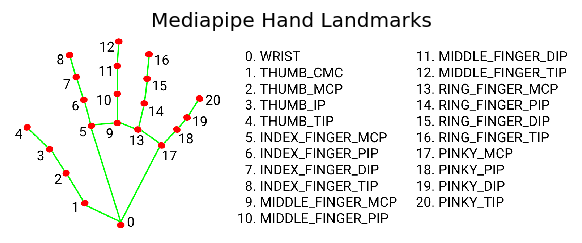

In [36]:
f1=cv2.imread('\\hand_landmarks.png')
plt.figure(dpi=120)
plt.title("Mediapipe Hand Landmarks")
plt.axis('off')

b,g,r=cv2.split(f1)
f1=cv2.merge([r,g,b])
plt.imshow(f1,interpolation='none')
plt.show()

We will need the findPosition method.
In this method we get the landmarks position of a specific hand that we convert into the image pixel equivalent position. We create a list with the id of the landmark and the image pixel equivalent position. And we draw bigger circles on the landmarks of this hand.

In [ ]:
    def findPosition(self, img, handNo=0, draw=True ):
        lmList = []
        if self.results.multi_hand_landmarks:
            myHand = self.results.multi_hand_landmarks[handNo]
            for id, lm in enumerate(myHand.landmark):
                #print(id,lm)
                h, w, c = img.shape
                cx,cy = int(lm.x*w), int(lm.y*h)
                #print(id,cx,cy)
                lmList.append([id,cx,cy])
                if draw:
                    cv2.circle(img, (cx,cy), 10, (255,0,255),cv2.FILLED)
        return lmList

##### From the list we get from the method findPosition, we can extract the position of the upper landmarks of every finger (landmarks 4, 8, 12 , 16, 20)
##### Moreover to be aware of the distance between the thumb and the other fingers, we could draw a line between the upper landmark of the thumb and the upper landmark of the other fingers. We could calculate the center of this line and draw a circle on it to make this more visual

In [9]:
m = 1.4;
hcam = int(480*m) #720
wcam = int(640*m) #1280
cap = cv2.VideoCapture(1)
cap.set(3,wcam)
cap.set(4,hcam)
wScreen, hScreen = autopy.screen.size()
detector = handDetector(detectionCon =0.7, trackCon=0.7)
pTime = 0
cTime = 0


while True:
    success,img = cap.read()
    img = detector.findHands(img)
    h, w, c = img.shape
    rw,rh = w/1900, h/1060 #w/1917, h/1075 # size plus faible 1900 / 1060
    lmList = detector.findPosition(img, handNo=0, draw = False)

    if len(lmList)!=0:
        # print(lmList[4])
        # print(lmList[8])
        x1,y1 = lmList[8][1],lmList[8][2]
        x2,y2 = lmList[12][1],lmList[12][2]
        xt,yt = lmList[4][1],lmList[4][2]
        x3,y3 = lmList[16][1],lmList[16][2]
        x4,y4 = lmList[20][1],lmList[20][2]
        cx1,cy1 = (xt+x1)//2, (yt+y1)//2
        cx2,cy2 = (xt+x2)//2, (yt+y2)//2
        cx2,cy2 = (xt+x2)//2, (yt+y2)//2
        cx3,cy3 = (xt+x3)//2, (yt+y3)//2
        cx4,cy4 = (xt+x4)//2, (yt+y4)//2
        cv2.line(img,(xt,yt),(x1,y1),(0,0,255), 2)
        cv2.line(img,(xt,yt),(x2,y2),(0,0,255), 2)
        cv2.line(img,(xt,yt),(x3,y3),(0,0,255), 2)
        cv2.line(img,(xt,yt),(x4,y4),(0,0,255), 2)
        cv2.circle(img, (cx1,cy1), 11, (0,0,255),cv2.FILLED)
        cv2.circle(img, (cx2,cy2), 11, (0,0,255),cv2.FILLED)
        cv2.circle(img, (cx3,cy3), 11, (0,0,255),cv2.FILLED)
        cv2.circle(img, (cx4,cy4), 11, (0,0,255),cv2.FILLED)

    cTime = time.time()
    fps = 1/(cTime-pTime)
    pTime = cTime

    cv2.putText(img,str(int(fps)),(10,50),cv2.FONT_HERSHEY_SCRIPT_SIMPLEX,1,(250,250,250),1)

    cv2.imshow("Image",img)

    if (cv2.waitKey(1) & 0xFF == ord('q')) :

    # test si on appuie sur q (ou x)
        break

# When everything done, release the capture
cap.release()
cv2.destroyAllWindows()

We will need to create a method to detect when a finger touch the thumb, using a threshold of distance between the upper landmark of the thumb and the one of the other finger. This method will return a boolean equals to True if the distance is below the threshold and False if the distance is greater than the threshold

In [ ]:
    def detect_touch(self, img, lmList, ref_landmark=4, landmark=8 , thresh=40 ):
        xref,yref = lmList[ref_landmark][1],lmList[ref_landmark][2]
        x1,y1 = lmList[landmark][1],lmList[landmark][2]
        cx1,cy1 = (xref+x1)//2, (yref+y1)//2
        cv2.line(img,(xref,yref),(x1,y1),(0,0,255), 2)
        cv2.circle(img, (cx1,cy1), 11, (0,0,255),cv2.FILLED)
        self.dist = math.hypot(xref-x1,yref-y1)
        if abs(self.dist)<thresh:
            #cv2.circle(img, (cx,cy), 11, (0,255,0),cv2.FILLED)
            return True
        else :
            return False

Let's add this method to the class

In [4]:

class handDetector():
    def __init__(self, mode=False,maxHands=2, detectionCon =0.5, trackCon=0.5 ):
        self.mode=mode
        self.maxHands = maxHands
        self.detectionCon = detectionCon
        self.trackCon = trackCon

        self.mpHands = mp.solutions.hands
        self.hands = self.mpHands.Hands(self.mode,self.maxHands,self.detectionCon,self.trackCon) #default parameters
        self.mpDraw = mp.solutions.drawing_utils

    def findHands(self, img, draw=True):
        imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        self.results = self.hands.process(imgRGB)
        #print(results.multi_hand_landmarks)
        if self.results.multi_hand_landmarks:
            for handLms in self.results.multi_hand_landmarks:

                if draw :
                    self.mpDraw.draw_landmarks(img, handLms, self.mpHands.HAND_CONNECTIONS)
        return img

    def findPosition(self, img, handNo=0, draw=True ):
        lmList = []
        if self.results.multi_hand_landmarks:
            myHand = self.results.multi_hand_landmarks[handNo]
            for id, lm in enumerate(myHand.landmark):
                #print(id,lm)
                h, w, c = img.shape
                cx,cy = int(lm.x*w), int(lm.y*h)
                #print(id,cx,cy)
                lmList.append([id,cx,cy])
                if draw:
                    cv2.circle(img, (cx,cy), 10, (255,0,255),cv2.FILLED)
        return lmList

    def detect_touch(self, img, lmList, ref_landmark=4, landmark=8 , thresh=40 ):
        xref,yref = lmList[ref_landmark][1],lmList[ref_landmark][2]
        x1,y1 = lmList[landmark][1],lmList[landmark][2]
        cx1,cy1 = (xref+x1)//2, (yref+y1)//2
        cv2.line(img,(xref,yref),(x1,y1),(0,0,255), 2)
        cv2.circle(img, (cx1,cy1), 11, (0,0,255),cv2.FILLED)
        self.dist = math.hypot(xref-x1,yref-y1)
        if abs(self.dist)<thresh:
            #cv2.circle(img, (cx,cy), 11, (0,255,0),cv2.FILLED)
            return True
        else :
            return False

def main():


    if __name__ == "__main__":
        main()

We add a simple but usefull functionality to stop the webcam and close the window if all the fingers are touching the thumb

In [15]:
m = 1.4;
hcam = int(480*m) #720
wcam = int(640*m) #1280
cap = cv2.VideoCapture(1)
cap.set(3,wcam)
cap.set(4,hcam)
wScreen, hScreen = autopy.screen.size()
detector = handDetector(detectionCon =0.7, trackCon=0.7)
pTime = 0
cTime = 0


while True:
    success,img = cap.read()
    img = detector.findHands(img)
    h, w, c = img.shape
    rw,rh = w/1900, h/1060 #w/1917, h/1075 # size plus faible 1900 / 1060
    lmList = detector.findPosition(img, handNo=0, draw = False)

    if len(lmList)!=0:
        # print(lmList[4])
        # print(lmList[8])
        x1,y1 = lmList[8][1],lmList[8][2]
        x2,y2 = lmList[12][1],lmList[12][2]
        xt,yt = lmList[4][1],lmList[4][2]
        x3,y3 = lmList[16][1],lmList[16][2]
        x4,y4 = lmList[20][1],lmList[20][2]
        cx1,cy1 = (xt+x1)//2, (yt+y1)//2
        cx2,cy2 = (xt+x2)//2, (yt+y2)//2
        cx2,cy2 = (xt+x2)//2, (yt+y2)//2
        cx3,cy3 = (xt+x3)//2, (yt+y3)//2
        cx4,cy4 = (xt+x4)//2, (yt+y4)//2
        
        test8 = detector.detect_touch(img,lmList,ref_landmark=4,landmark=8,thresh=38)
        test12 = detector.detect_touch(img,lmList,ref_landmark=4,landmark=12,thresh=40)
        test16 = detector.detect_touch(img,lmList,ref_landmark=4,landmark=16,thresh=40)
        test20 = detector.detect_touch(img,lmList,ref_landmark=4,landmark=20,thresh=39)
        if test8:
            cv2.circle(img, (cx1,cy1), 11, (0,255,0),cv2.FILLED)
            #cv2.rectangle(img,[int(w*0.08),int(h*0.1)],[int(w*0.92),int(h*0.9)],[255,255,255],3)


        if test12: #more difficult to detect precisely
            cv2.circle(img, (cx2,cy2), 11, (0,255,0),cv2.FILLED)
        if test16:
            cv2.circle(img, (cx3,cy3), 11, (0,255,0),cv2.FILLED)

        if test20:
            cv2.circle(img, (cx4,cy4), 11, (0,255,0),cv2.FILLED)
            if test8 and test12 and test16 :
                break

    cTime = time.time()
    fps = 1/(cTime-pTime)
    pTime = cTime

    #cv2.line(img,(0,int(0.9*h)),(w,int(0.9*h)),(255,255,255), 4)
    cv2.putText(img,str(int(fps)),(10,50),cv2.FONT_HERSHEY_SCRIPT_SIMPLEX,1,(250,250,250),1)

    cv2.imshow("Image",img)

    if (cv2.waitKey(1) & 0xFF == ord('q')) :

    # test si on appuie sur q (ou x)
        break

# When everything done, release the capture
cap.release()
cv2.destroyAllWindows()

### Now we are going to attack the control of the mouse
#### We use some fonctions of pynput.mouse

In [ ]:
px1, py1 #previous coord of the upper landmark of the thumb
x1,y1 #actual coord of the upper landmark of the thumb
mouse = Controller()
mouse.click(Button.left,N)  # to make N left Click
mouse.move(x1-px1,y1-py1) # to move the mouse cursor
mouse.press(Button.left) # to hold Left Click
mouse.release(Button.left) # to release Left CLick

As the detection of hand and fingers is harder on the edge of the video, when the hand is not totally visible, we will limit the detection to a rectangle area that we will draw on the video. 

In [22]:
m = 1.4;
hcam = int(480*m) #720
wcam = int(640*m) #1280
cap = cv2.VideoCapture(1)
cap.set(3,wcam)
cap.set(4,hcam)
wScreen, hScreen = autopy.screen.size()
detector = handDetector(detectionCon =0.7, trackCon=0.7)
mouse = Controller()
pTime = 0
cTime = 0
px1, py1 = 0,0
pdx1, pdy1 = 0,0



while True:
    success,img = cap.read()
    img = detector.findHands(img)
    h, w, c = img.shape
    rw,rh = w/1900, h/1060 #w/1917, h/1075 # size plus faible 1900 / 1060
    lmList = detector.findPosition(img, handNo=0, draw = False)
    rect_min_x = int(w*0.08)
    rect_max_x = int(w*0.94)
    rect_min_y = int(h*0.1)
    rect_max_y = int(h*0.85)
    
    if len(lmList)!=0:
        # print(lmList[4])
        # print(lmList[8])
        x1,y1 = lmList[8][1],lmList[8][2]
        x2,y2 = lmList[12][1],lmList[12][2]
        xt,yt = lmList[4][1],lmList[4][2]
        x3,y3 = lmList[16][1],lmList[16][2]
        x4,y4 = lmList[20][1],lmList[20][2]
        cx1,cy1 = (xt+x1)//2, (yt+y1)//2
        cx2,cy2 = (xt+x2)//2, (yt+y2)//2
        cx3,cy3 = (xt+x3)//2, (yt+y3)//2
        cx4,cy4 = (xt+x4)//2, (yt+y4)//2
        test8 = detector.detect_touch(img,lmList,ref_landmark=4,landmark=8,thresh=38)
        test12 = detector.detect_touch(img,lmList,ref_landmark=4,landmark=12,thresh=40)
        test16 = detector.detect_touch(img,lmList,ref_landmark=4,landmark=16,thresh=40)
        test20 = detector.detect_touch(img,lmList,ref_landmark=4,landmark=20,thresh=39)
        if (x1>=rect_min_x) and (x1<=rect_max_x) and (y1>=rect_min_y) and (y1<=rect_max_y) :
            if test8:
                cv2.circle(img, (cx1,cy1), 11, (0,255,0),cv2.FILLED)
                cv2.rectangle(img,[rect_min_x,rect_min_y],[rect_max_x,rect_max_y],[255,255,255],3)
                mouse.move(-(x1-px1)/1.2,(y1-py1)/1.3) 
            pdx1 = x1 - px1
            pdy1 = y1 - py1
            px1 =x1;
            py1 =y1;


            mouse.release(Button.left)
            if test12: #plus difficile à capter précisément
                cv2.circle(img, (cx2,cy2), 11, (0,255,0),cv2.FILLED)
                cv2.rectangle(img,[rect_min_x,rect_min_y],[rect_max_x,rect_max_y],[255,255,255],3)
                mouse.click(Button.left,1)
            if test16:
                cv2.circle(img, (cx3,cy3), 11, (0,255,0),cv2.FILLED)
                cv2.rectangle(img,[rect_min_x,rect_min_y],[rect_max_x,rect_max_y],[255,255,255],3)
                mouse.click(Button.right,1)

            if test20:
                cv2.circle(img, (cx4,cy4), 11, (0,255,0),cv2.FILLED)
                cv2.rectangle(img,[rect_min_x,rect_min_y],[rect_max_x,rect_max_y],[255,255,255],3)
                mouse.press(Button.left)
                if test8 and test12 and test16 :
                    break

    cTime = time.time()
    fps = 1/(cTime-pTime)
    pTime = cTime

    #cv2.line(img,(0,int(0.9*h)),(w,int(0.9*h)),(255,255,255), 4)
    cv2.putText(img,str(int(fps)),(10,50),cv2.FONT_HERSHEY_SCRIPT_SIMPLEX,1,(250,250,250),1)

    cv2.imshow("Image",img)

    if (cv2.waitKey(1) & 0xFF == ord('q')) :

    # test si on appuie sur q (ou x)
        break

# When everything done, release the capture
cap.release()
cv2.destroyAllWindows()

We can adapt the equation that gave the movement of the cursor to be able to access all the screen and to be more or less sensitive. Moreover to smooth the movement of the cursor we can add a low-pass filter

In [ ]:
    def filter_low_pass(dx1,dy1,last_value=[[0,0],[0,0]])
        move_x, move_y = (dx1+last_value[0][0]+last_value[0][1])/3,(dy1+last_value[1][0]+last_value[1][1])/3
        last_value[0][1],last_value[1][1] = last_value[0][0],last_value[1][0]
        last_value[0][0],last_value[1][0] = dx1,dy1
        return move_x,move_y

This low_pass filter returns the mean value of the 3 past position movements on x and y

In [27]:
class handDetector():
    def __init__(self, mode=False,maxHands=2, detectionCon =0.5, trackCon=0.5 ):
        self.mode=mode
        self.maxHands = maxHands
        self.detectionCon = detectionCon
        self.trackCon = trackCon

        self.mpHands = mp.solutions.hands
        self.hands = self.mpHands.Hands(self.mode,self.maxHands,self.detectionCon,self.trackCon) #default parameters
        self.mpDraw = mp.solutions.drawing_utils

    def findHands(self, img, draw=True):
        imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        self.results = self.hands.process(imgRGB)
        #print(results.multi_hand_landmarks)
        if self.results.multi_hand_landmarks:
            for handLms in self.results.multi_hand_landmarks:

                if draw :
                    self.mpDraw.draw_landmarks(img, handLms, self.mpHands.HAND_CONNECTIONS)
        return img

    def findPosition(self, img, handNo=0, draw=True ):
        lmList = []
        if self.results.multi_hand_landmarks:
            myHand = self.results.multi_hand_landmarks[handNo]
            for id, lm in enumerate(myHand.landmark):
                #print(id,lm)
                h, w, c = img.shape
                cx,cy = int(lm.x*w), int(lm.y*h)
                #print(id,cx,cy)
                lmList.append([id,cx,cy])
                if draw:
                    cv2.circle(img, (cx,cy), 10, (255,0,255),cv2.FILLED)
        return lmList
    

    def detect_touch(self, img, lmList, ref_landmark=4, landmark=8 , thresh=40 ):
        xref,yref = lmList[ref_landmark][1],lmList[ref_landmark][2]
        x1,y1 = lmList[landmark][1],lmList[landmark][2]
        cx1,cy1 = (xref+x1)//2, (yref+y1)//2
        cv2.line(img,(xref,yref),(x1,y1),(0,0,255), 2)
        cv2.circle(img, (cx1,cy1), 11, (0,0,255),cv2.FILLED)
        self.dist = math.hypot(xref-x1,yref-y1)
        if abs(self.dist)<thresh:
            #cv2.circle(img, (cx,cy), 11, (0,255,0),cv2.FILLED)
            return True
        else :
            return False

def filter_low_pass(dx1,dy1,last_value=[[0,0],[0,0]]):
    move_x, move_y = (dx1+last_value[0][0]+last_value[0][1])/3,(dy1+last_value[1][0]+last_value[1][1])/3
    last_value[0][1],last_value[1][1] = last_value[0][0],last_value[1][0]
    last_value[0][0],last_value[1][0] = dx1,dy1
    return move_x,move_y

def main():
    if __name__ == "__main__":
        main()

In [30]:
m = 1.4;
hcam = int(480*m) #720
wcam = int(640*m) #1280
cap = cv2.VideoCapture(1)
size = cap.get(1)
cap.set(3,wcam)
cap.set(4,hcam)
wScreen, hScreen = autopy.screen.size()
detector = handDetector(detectionCon =0.7, trackCon=0.7)
mouse = Controller()
pTime = 0
cTime = 0
px1, py1 = 0,0
pdx1, pdy1 = 0,0

while True:
    success,img = cap.read()
    img = detector.findHands(img)
    h, w, c = img.shape
    rw,rh = w/1900, h/1060 #w/1917, h/1075 # size plus faible 1900 / 1060
    lmList = detector.findPosition(img, handNo=0, draw = False)
    rect_min_x = int(w*0.08)
    rect_max_x = int(w*0.94)
    rect_min_y = int(h*0.1)
    rect_max_y = int(h*0.85)

    if len(lmList)!=0:
        # print(lmList[4])
        # print(lmList[8])
        x1,y1 = lmList[8][1],lmList[8][2]
        x2,y2 = lmList[12][1],lmList[12][2]
        xt,yt = lmList[4][1],lmList[4][2]
        x3,y3 = lmList[16][1],lmList[16][2]
        x4,y4 = lmList[20][1],lmList[20][2]
        cx1,cy1 = (xt+x1)//2, (yt+y1)//2
        cx2,cy2 = (xt+x2)//2, (yt+y2)//2
        cx3,cy3 = (xt+x3)//2, (yt+y3)//2
        cx4,cy4 = (xt+x4)//2, (yt+y4)//2
        # cv2.line(img,(xt,yt),(x1,y1),(0,0,255), 2)
        # cv2.line(img,(xt,yt),(x2,y2),(0,0,255), 2)
        # cv2.line(img,(xt,yt),(x3,y3),(0,0,255), 2)
        # cv2.line(img,(xt,yt),(x4,y4),(0,0,255), 2))

        test8 = detector.detect_touch(img,lmList,ref_landmark=4,landmark=8,thresh=37)
        test12 = detector.detect_touch(img,lmList,ref_landmark=4,landmark=12,thresh=39)
        test16 = detector.detect_touch(img,lmList,ref_landmark=4,landmark=16,thresh=39)
        test20 = detector.detect_touch(img,lmList,ref_landmark=4,landmark=20,thresh=38)
        if (x1>=rect_min_x) and (x1<=rect_max_x) and (y1>=rect_min_y) and (y1<=rect_max_y) :
            if test8:
                cv2.circle(img, (cx1,cy1), 11, (0,255,0),cv2.FILLED)
                cv2.rectangle(img,[rect_min_x,rect_min_y],[rect_max_x,rect_max_y],[255,255,255],3)
                #mouse.position = (int(cx1/rw/0.83-w*0.2),int(cy1/rh/0.83-h*0.2))
                move_x, move_y = filter_low_pass(pdx1,pdy1) #smoothering
                mouse.move(-(move_x)/0.5,(move_y)/0.5)
            pdx1 = x1 - px1
            pdy1 = y1 - py1
            px1 =x1;
            py1 =y1;


            #mouse.release(Button.left)
            if test12: #plus difficile à capter précisément
                cv2.circle(img, (cx2,cy2), 11, (0,255,0),cv2.FILLED)
                cv2.rectangle(img,[rect_min_x,rect_min_y],[rect_max_x,rect_max_y],[255,255,255],3)
                mouse.click(Button.left,1)
                time.sleep(0.05) # we add a pause time to avoîd multiple clicks
            if test16:
                cv2.circle(img, (cx3,cy3), 11, (0,255,0),cv2.FILLED)
                cv2.rectangle(img,[rect_min_x,rect_min_y],[rect_max_x,rect_max_y],[255,255,255],3)
                mouse.click(Button.right,1)
                time.sleep(0.05)
            if test20:
                cv2.circle(img, (cx4,cy4), 11, (0,255,0),cv2.FILLED)
                cv2.rectangle(img,[rect_min_x,rect_min_y],[rect_max_x,rect_max_y],[255,255,255],3)
                mouse.press(Button.left)
                if test8 and test12 and test16 :
                    break

    cTime = time.time()
    fps = 1/(cTime-pTime)
    pTime = cTime

    #cv2.line(img,(0,int(0.9*h)),(w,int(0.9*h)),(255,255,255), 4)
    cv2.putText(img,str(int(fps)),(10,50),cv2.FONT_HERSHEY_SCRIPT_SIMPLEX,1,(250,250,250),1)

    cv2.imshow("Image",img)

    if (cv2.waitKey(1) & 0xFF == ord('q')) :

    # test si on appuie sur q (ou x)
        break

# When everything done, release the capture
mouse.release(Button.left)
cap.release()
cv2.destroyAllWindows()

#### The control easiness could be increased but it seems to work.

Let's test our new mouse control for a specific task which need some precision

We will try to click on an icon and do a drag and drop in the expected folder

#### Video :

In [11]:
pip install moviepy

Note: you may need to restart the kernel to use updated packages.


In [6]:
from moviepy.editor import *

In [33]:
path = ".\\test_HandTracking_JupyterLab.mp4"
video = VideoFileClip(path, audio=False)
video.ipython_display(width=520,maxduration=100)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


Notice that the camera shows the image in reverse like in front of a mirror.

### Conclusion
#### The detection of the hand is not perfect and the controlability could be improved